Verificando bibliotecas...

Usando dispositivo: cuda
Pasta de dados encontrada: /content/drive/MyDrive/teste-PL-final

--- Resumo dos Dados ---
Total de classes: 20
Imagens de Treino: 4899
Imagens de Validação: 1225
------------------------------
Baixando modelo ResNet18...
>> MODO SELECIONADO: Pesos DESCONGELADOS (Fine-Tuning)
Iniciando treinamento por 15 épocas...
Epoch 1/15
train Loss: 1.5887 Acc: 0.5471
val Loss: 0.8176 Acc: 0.7396
Epoch 2/15
train Loss: 0.9092 Acc: 0.7299
val Loss: 0.5972 Acc: 0.8171
Epoch 3/15
train Loss: 0.7457 Acc: 0.7712
val Loss: 0.5860 Acc: 0.8229
Epoch 4/15
train Loss: 0.6500 Acc: 0.8049
val Loss: 0.4793 Acc: 0.8514
Epoch 5/15
train Loss: 0.5624 Acc: 0.8240
val Loss: 0.4880 Acc: 0.8498
Epoch 6/15
train Loss: 0.5250 Acc: 0.8457
val Loss: 0.4291 Acc: 0.8669
Epoch 7/15
train Loss: 0.4767 Acc: 0.8538
val Loss: 0.4135 Acc: 0.8718
Epoch 8/15
train Loss: 0.4517 Acc: 0.8649
val Loss: 0.4160 Acc: 0.8645
Epoch 9/15
train Loss: 0.4056 Acc: 0.8751
val Loss: 0.4334 Acc:

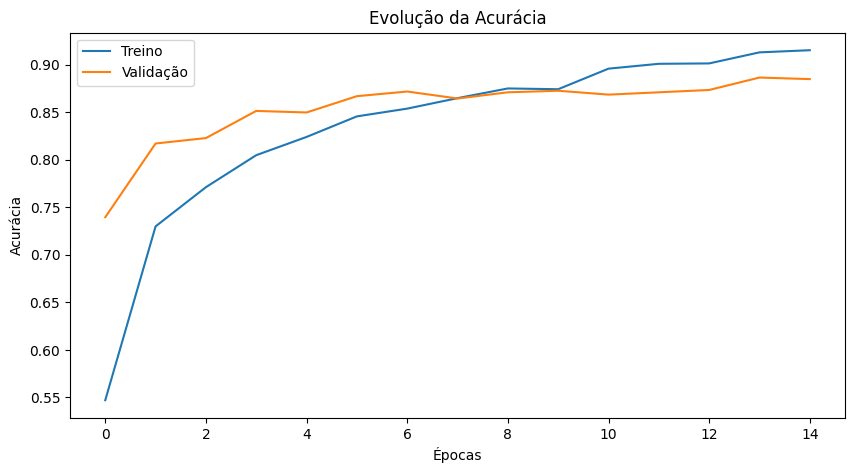

Gerando dados para Matriz de Confusão...


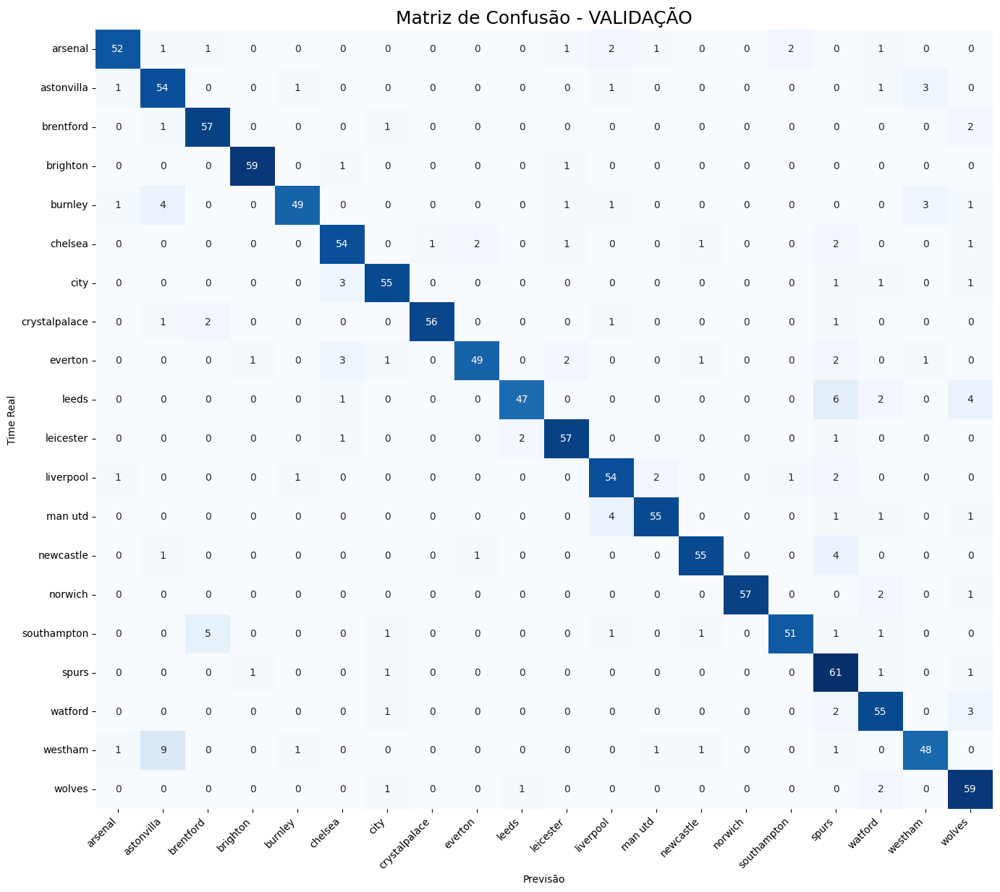


Analisando dataset para encontrar os Top Erros...

--- TOP 5 MAIORES CONFUSÕES ---
• WESTHAM -> ASTONVILLA: 9 erros
• LEEDS -> SPURS: 6 erros
• SOUTHAMPTON -> BRENTFORD: 5 erros
• NEWCASTLE -> SPURS: 4 erros
• MAN UTD -> LIVERPOOL: 4 erros

>>> Visualizando: westham confundido com astonvilla


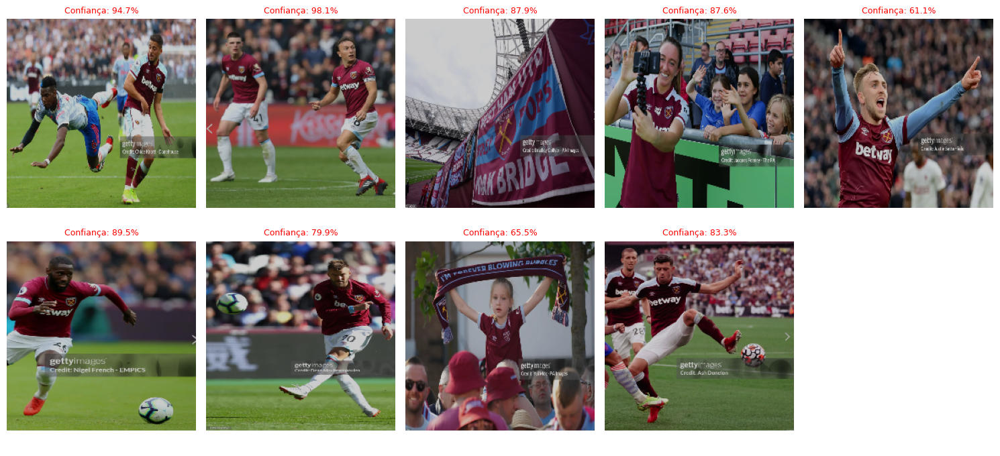


>>> Visualizando: leeds confundido com spurs


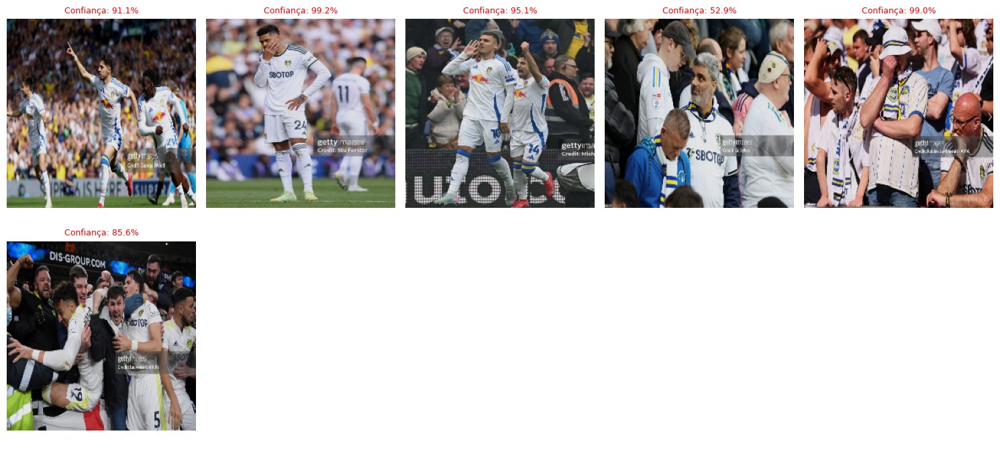


>>> Visualizando: southampton confundido com brentford


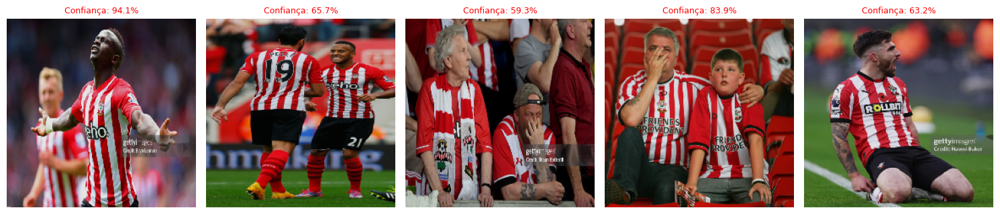


>>> Visualizando: newcastle confundido com spurs


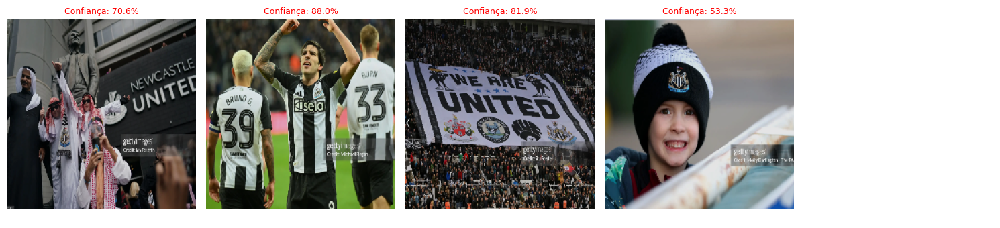


>>> Visualizando: man utd confundido com liverpool


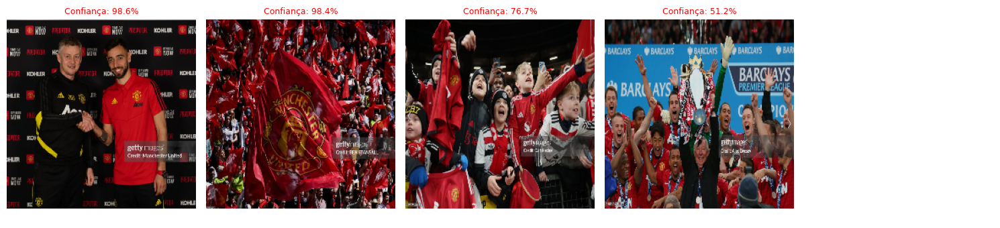


--- RELATÓRIO DE MÉTRICAS POR CLASSE ---
               precision  recall  f1-score
arsenal             0.93    0.85      0.89
astonvilla          0.76    0.89      0.82
brentford           0.88    0.93      0.90
brighton            0.97    0.97      0.97
burnley             0.94    0.82      0.88
chelsea             0.86    0.87      0.86
city                0.90    0.90      0.90
crystalpalace       0.98    0.92      0.95
everton             0.94    0.82      0.88
leeds               0.94    0.78      0.85
leicester           0.90    0.93      0.92
liverpool           0.84    0.89      0.86
man utd             0.93    0.89      0.91
newcastle           0.93    0.90      0.92
norwich             1.00    0.95      0.97
southampton         0.94    0.84      0.89
spurs               0.72    0.94      0.81
watford             0.82    0.90      0.86
westham             0.87    0.77      0.82
wolves              0.80    0.94      0.86
accuracy            0.88    0.88      0.88
macro avg   

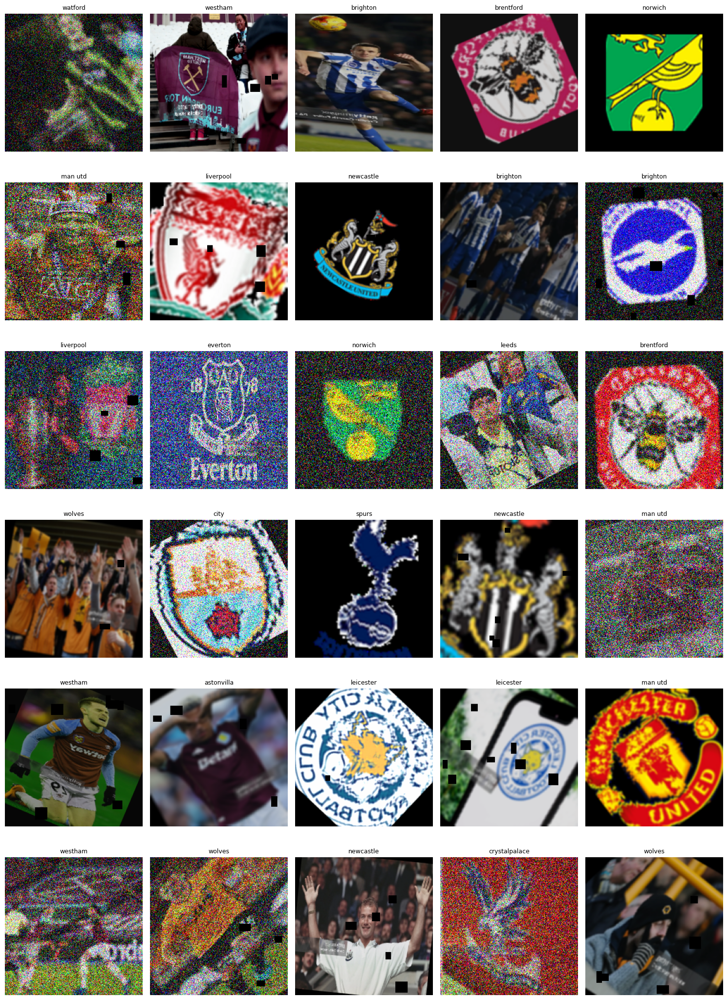

In [ ]:
# =============================================================================
# 1. INSTALAÇÃO E SETUP
# =============================================================================
print("Verificando bibliotecas...")
!pip install -U albumentations -q

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, models, transforms
from sklearn.model_selection import train_test_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from collections import Counter
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import pandas as pd

# Montar Google Drive
if not os.path.exists('/content/drive'):
    print("Montando Google Drive...")
    drive.mount('/content/drive')

# =============================================================================
# 2. CONFIGURAÇÕES
# =============================================================================
DATA_DIR = '/content/drive/MyDrive/teste-PL-final'

BATCH_SIZE = 32
NUM_CLASSES = 20
LEARNING_RATE = 0.0001 # LR baixo recomendado para Fine-Tuning
NUM_EPOCHS = 15
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"\nUsando dispositivo: {DEVICE}")
if not os.path.exists(DATA_DIR):
    print(f"ERRO: A pasta {DATA_DIR} não foi encontrada.")
else:
    print(f"Pasta de dados encontrada: {DATA_DIR}")

# =============================================================================
# 3. DEFINIÇÃO DAS AUGMENTATIONS (HARDCORE MODE)
# =============================================================================
train_transform = A.Compose([
    A.Resize(224, 224),

    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=45, p=0.7),
    A.Perspective(scale=(0.05, 0.1), p=0.5),

    A.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1, p=0.5),
    A.GaussianBlur(blur_limit=(3, 7), p=0.5),
    A.GaussNoise(p=0.5),

    A.CoarseDropout(num_holes_range=(1, 8), hole_height_range=(8, 20), hole_width_range=(8, 20), p=0.5),

    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# =============================================================================
# 4. PREPARAÇÃO DOS DADOS
# =============================================================================
class AlbumentationsDataset(torch.utils.data.Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, idx):
        original_idx = self.subset.indices[idx]
        path, label = self.subset.dataset.samples[original_idx]

        image = cv2.imread(path)
        if image is None:
            return torch.zeros(3, 224, 224), label

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        return image, label

    def __len__(self):
        return len(self.subset)

full_dataset = datasets.ImageFolder(root=DATA_DIR)
class_names = full_dataset.classes

train_idx, val_idx = train_test_split(
    list(range(len(full_dataset))),
    test_size=0.2,
    stratify=full_dataset.targets,
    random_state=42
)

train_dataset = AlbumentationsDataset(Subset(full_dataset, train_idx), transform=train_transform)
val_dataset = AlbumentationsDataset(Subset(full_dataset, val_idx), transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"\n--- Resumo dos Dados ---")
print(f"Total de classes: {len(class_names)}")
print(f"Imagens de Treino: {len(train_dataset)}")
print(f"Imagens de Validação: {len(val_dataset)}")
print("-" * 30)

# =============================================================================
# 5. MODELO (ESCOLHA A ESTRATÉGIA)
# =============================================================================
print("Baixando modelo ResNet18...")
weights = models.ResNet18_Weights.IMAGENET1K_V1
model = models.resnet18(weights=weights)

for param in model.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, NUM_CLASSES)
model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# =============================================================================
# 6. LOOP DE TREINAMENTO
# =============================================================================
def train_model(model, criterion, optimizer, num_epochs=15):
    train_acc_history = []
    val_acc_history = []

    print(f"Iniciando treinamento por {num_epochs} épocas...")

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                dataloader = train_loader
            else:
                model.eval()
                dataloader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloader:
                inputs = inputs.to(DEVICE)
                labels = labels.to(DEVICE)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_acc_history.append(epoch_acc.item())
            else:
                val_acc_history.append(epoch_acc.item())

    print('\nTreinamento concluído!')
    return model, train_acc_history, val_acc_history

model_ft, train_hist, val_hist = train_model(model, criterion, optimizer, num_epochs=NUM_EPOCHS)

# =============================================================================
# 7. GRÁFICOS DE EVOLUÇÃO
# =============================================================================
plt.figure(figsize=(10, 5))
plt.title("Evolução da Acurácia")
plt.plot(train_hist, label="Treino")
plt.plot(val_hist, label="Validação")
plt.xlabel("Épocas")
plt.ylabel("Acurácia")
plt.legend()
plt.show()

# =============================================================================
# 8. MATRIZ DE CONFUSÃO
# =============================================================================
def get_all_predictions(model, loader):
    model.eval()
    all_preds = []
    all_labels = []
    print("Gerando dados para Matriz de Confusão...")
    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(DEVICE)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return np.array(all_labels), np.array(all_preds)

val_labels, val_preds = get_all_predictions(model_ft, val_loader)

plt.figure(figsize=(16, 14))
cm = confusion_matrix(val_labels, val_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, cbar=False)
plt.title("Matriz de Confusão - VALIDAÇÃO", fontsize=18)
plt.ylabel('Time Real')
plt.xlabel('Previsão')
plt.xticks(rotation=45, ha='right')
plt.show()

# =============================================================================
# 9. VISUALIZAÇÃO DOS MAIORES ERROS (AUTOMÁTICO)
# =============================================================================
def visualize_top_confusions(model, loader, top_k=5):
    model.eval()
    all_errors = []
    error_counts = Counter()
    idx_to_class = {i: name for i, name in enumerate(class_names)}

    print("\nAnalisando dataset para encontrar as maiores ocorrências de erros...")

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(DEVICE)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            probs = torch.nn.functional.softmax(outputs, dim=1)

            for i in range(inputs.size(0)):
                t_idx = labels[i].item()
                p_idx = preds[i].item()

                if t_idx != p_idx:
                    pair = (idx_to_class[t_idx], idx_to_class[p_idx])
                    error_counts[pair] += 1

                    img = inputs[i].cpu().permute(1, 2, 0).numpy()
                    img = std * img + mean
                    img = np.clip(img, 0, 1)
                    conf = probs[i][p_idx].item() * 100

                    all_errors.append({'pair': pair, 'image': img, 'conf': conf})

    top_errors = error_counts.most_common(top_k)

    if not top_errors:
        print("Nenhum erro encontrado!")
        return

    print(f"\n--- TOP {top_k} MAIORES CONFUSÕES ---")
    for pair, count in top_errors:
        print(f"• {pair[0].upper()} -> {pair[1].upper()}: {count} erros")

    for (target_true, target_pred), count in top_errors:
        print(f"\n>>> Visualizando: {target_true} confundido com {target_pred}")
        imgs = [e for e in all_errors if e['pair'] == (target_true, target_pred)]

        cols = 5
        rows = (len(imgs) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(15, 3.5 * rows))
        if len(imgs) == 1: axes = [axes]
        axes = np.array(axes).flatten()

        for i, ax in enumerate(axes):
            if i < len(imgs):
                ax.imshow(imgs[i]['image'])
                ax.set_title(f"Confiança: {imgs[i]['conf']:.1f}%", color='red', fontsize=9)
            ax.axis('off')
        plt.tight_layout()
        plt.show()

visualize_top_confusions(model_ft, val_loader, top_k=5)

# =============================================================================
# 10. RELATÓRIO DE MÉTRICAS (F1-SCORE)
# =============================================================================
def generate_metrics_report(y_true, y_pred, classes):
    report = classification_report(y_true, y_pred, target_names=classes, output_dict=True)
    df = pd.DataFrame(report).transpose()
    print("\n--- RELATÓRIO DE MÉTRICAS POR CLASSE ---")
    print(df[['precision', 'recall', 'f1-score']].round(2))

generate_metrics_report(val_labels, val_preds, class_names)

# =============================================================================
# 11. VISUALIZAR 30 EXEMPLOS DE DATA AUGMENTATION (TREINO)
# =============================================================================
def visualize_training_samples(dataset, class_names, num_samples=30):
    print(f"\n--- EXEMPLOS DE DATA AUGMENTATION ---")

    cols = 5
    rows = (num_samples + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3.5))
    axes = axes.flatten()

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    indices = np.random.choice(len(dataset), num_samples, replace=False)

    for i, ax in enumerate(axes):
        if i < num_samples:
            idx = indices[i]
            image, label = dataset[idx]

            image = image.permute(1, 2, 0).cpu().numpy()
            image = std * image + mean
            image = np.clip(image, 0, 1)

            ax.imshow(image)
            ax.set_title(f"{class_names[label]}", fontsize=9)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

visualize_training_samples(train_dataset, class_names, num_samples=30)